In [4]:
!git clone -q https://github.com/anthropics/jacobian-lens.git
%cd jacobian-lens
!pip install -q -e .
!pip install -q tqdm

/content/jacobian-lens
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for jlens (pyproject.toml) ... done


In [5]:
import gzip, json, random, re, time
from collections import Counter
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import transformers
from tqdm.auto import tqdm

import jlens
from jlens.vis import build_page, compute_slice, notebook_iframe
# Private, but they're what the page itself uses — importing them is how I guarantee my
# top-1 / rank numbers are the same ones the page renders instead of a lookalike.
from jlens.vis import _meaningful_token_mask, _ranks_of

jlens.configure_logging()
REPO = Path.cwd()
print(REPO, torch.__version__, transformers.__version__)

/content/jacobian-lens 2.11.0+cu128 5.16.1


In [ ]:
MODEL_NAME = None

LENS_REPO = "neuronpedia/jacobian-lens"
LENS_REVISION = "qwen-n1000"
MAX_PROMPTS = 250     
PER_SOURCE = None      
MAX_SEQ_LEN = 192
LAYER_CHUNK = 6        
SEED = 0
OUT = Path("/content/jlens_week1"); OUT.mkdir(parents=True, exist_ok=True)
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

In [7]:
from huggingface_hub import HfApi

lens_files = [f for f in HfApi().list_repo_files(LENS_REPO, revision=LENS_REVISION)
              if f.endswith(".pt")]

def lens_size(path):
    m = re.search(r"(\d+(?:\.\d+)?)b", path.split("/")[0].lower())
    return float(m.group(1)) if m else float("inf")

def lens_model(path):
    return "Qwen/" + Path(path).name.split("_jacobian_lens")[0]

qwen = sorted([f for f in lens_files if "qwen" in f.lower()], key=lens_size)
for f in qwen:
    print(f"{lens_size(f):>6}B  {lens_model(f):<26} {f}")

if MODEL_NAME is None:
    LENS_FILE = qwen[0]
    MODEL_NAME = lens_model(LENS_FILE)
else:
    LENS_FILE = next(f for f in lens_files if lens_model(f) == MODEL_NAME)

print(f"\n-> {MODEL_NAME}\n   {LENS_FILE}")

   0.8B  Qwen/Qwen3.5-0.8B          qwen3.5-0.8b/jlens/Salesforce-wikitext/Qwen3.5-0.8B_jacobian_lens.pt
   1.7B  Qwen/Qwen3-1.7B            qwen3-1.7b/jlens/Salesforce-wikitext/Qwen3-1.7B_jacobian_lens.pt
   2.0B  Qwen/Qwen3.5-2B-Base       qwen3.5-2b-pt/jlens/Salesforce-wikitext/Qwen3.5-2B-Base_jacobian_lens.pt
   4.0B  Qwen/Qwen3-4B              qwen3-4b/jlens/Salesforce-wikitext/Qwen3-4B_jacobian_lens.pt
   4.0B  Qwen/Qwen3.5-4B            qwen3.5-4b/jlens/Salesforce-wikitext/Qwen3.5-4B_jacobian_lens.pt
   4.0B  Qwen/Qwen3.5-4B            qwen3.5-4b/jlens/Salesforce-wikitext/Qwen3.5-4B_jacobian_lens_n1000.pt
   7.0B  Qwen/Qwen2.5-7B-Instruct   qwen2.5-7b-it/jlens/Salesforce-wikitext/Qwen2.5-7B-Instruct_jacobian_lens.pt
   8.0B  Qwen/Qwen3-8B              qwen3-8b/jlens/Salesforce-wikitext/Qwen3-8B_jacobian_lens.pt
   9.0B  Qwen/Qwen3.5-9B-Base       qwen3.5-9b-pt/jlens/Salesforce-wikitext/Qwen3.5-9B-Base_jacobian_lens.pt
  14.0B  Qwen/Qwen3-14B             qwen3-14b/jlens/Salesforc

## 1. Model

In [ ]:
big = "27B" in MODEL_NAME

DTYPE = torch.bfloat16 if torch.cuda.get_device_capability()[0] >= 8 else torch.float16

hf_model = transformers.AutoModelForCausalLM.from_pretrained(
    MODEL_NAME,
    dtype=DTYPE,
    **({"device_map": "auto"} if big else {}),
)
if not big:
    hf_model = hf_model.cuda()

tokenizer = transformers.AutoTokenizer.from_pretrained(MODEL_NAME)
model = jlens.from_hf(hf_model, tokenizer)
print(DTYPE)
model

config.json:   0%|          | 0.00/2.91k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/50.9k [00:00<?, ?B/s]

model.safetensors-00001-of-00001.safeten(…): reconstructing file:   0%|          |  0.00B / 1.75GB            

model.safetensors-00001-of-00001.safeten(…): downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/320 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/6.72M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/3.35M [00:00<?, ?B/s]

tokenizer.json: reconstructing file:   0%|          |  0.00B / 12.8MB            

tokenizer.json: downloading bytes:           |  0.00B            

chat_template.jinja:   0%|          | 0.00/7.75k [00:00<?, ?B/s]

torch.float16


HFLensModel(Qwen3_5ForCausalLM, n_layers=24, d_model=1024)

In [9]:
lens = jlens.JacobianLens.from_pretrained(LENS_REPO, filename=LENS_FILE, revision=LENS_REVISION)
FINAL_LAYER = model.n_layers - 1
GRID_LAYERS = lens.source_layers + [FINAL_LAYER]
print(lens)
print(f"fitted {len(lens.source_layers)} layers, model row is L{FINAL_LAYER}")

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

JacobianLens(d_model=1024, n_prompts=233, source_layers=[0..22] (23 layers))
fitted 23 layers, model row is L23


In [10]:
prompt = "Fact: The currency used in the country shaped like a boot is"
probe_layers = [
    model.n_layers // 4,
    model.n_layers // 2,
    model.n_layers // 4 * 3,
    model.n_layers - 2,
]

jlens_logits, model_logits, _ = lens.apply(model, prompt, layers=probe_layers, positions=[-2])
logit_lens, _, _ = lens.apply(
    model, prompt, layers=probe_layers, positions=[-2], use_jacobian=False
)

def top5(logits):
    return [tokenizer.decode([t]) for t in logits.topk(5).indices]

for layer in probe_layers:
    print(f"L{layer:>3} logit-lens: {top5(logit_lens[layer][0])}")
    print(f"L{layer:>3} J-lens:     {top5(jlens_logits[layer][0])}")
print(f"model:           {top5(model_logits[0])}")

L  6 logit-lens: [' shaped', 'aine', 'iera', 'iman', 'legs']
L  6 J-lens:     [' boots', ' boot', '靴', '-boot', 'boot']
L 12 logit-lens: ['那么大', 'icular', '坏处', 'EMAT', '益']
L 12 J-lens:     [' boots', ' boot', ' heel', ' shoes', 'legs']
L 18 logit-lens: ['坏处', 'less', '坏了', 'ained', 'ie']
L 18 J-lens:     [' boots', '靴', 'boot', 'heel', ' boot']
L 22 logit-lens: [' is', 'ie', 'heel', ' heel', 'less']
L 22 J-lens:     ['heel', ' heel', ' is', 'strap', '-print']
model:           [' is', '.', ',', '\n', ' with']


In [11]:
from jlens.examples import EXAMPLES, resolve_prompt

gloss = {int(k): v for k, v in json.load(gzip.open(REPO / "assets/qwen_gloss.json.gz")).items()}

example = next(e for e in EXAMPLES if e.slug == "multihop")
demo_prompt = resolve_prompt(example, tokenizer)

demo_slice = compute_slice(model, lens, demo_prompt, layer_stride=2, mask_display=True,
                           max_seq_len=MAX_SEQ_LEN)
demo_page, _, _ = build_page(
    demo_slice, demo_prompt,
    title=example.section, description=example.description, alt_token=gloss,
)
(OUT / "slice_multihop.html").write_text(demo_page)
notebook_iframe(demo_page)

In [ ]:
DEV = "cuda" if torch.cuda.is_available() else "cpu"
DISPLAY_MASK = None 

def display_mask(vocab_size, device):
    global DISPLAY_MASK
    if DISPLAY_MASK is None:
        DISPLAY_MASK = _meaningful_token_mask(tokenizer, vocab_size, device)
    return DISPLAY_MASK.to(device)


def _reduce(logits):
    logits = logits.to(DEV)
    masked = logits.masked_fill(~display_mask(logits.shape[-1], logits.device), float("-inf"))
    top = masked.argmax(-1, keepdim=True)
    ranks = _ranks_of(logits, top, chunk_size=64)[:, 0]
    logp = torch.log_softmax(logits, -1)
    entropy = -(logp.exp() * logp).sum(-1)
    out = (top[:, 0], ranks, logits.argmax(-1), entropy)
    return tuple(t.cpu().numpy() for t in out[:3]) + (out[3].cpu().numpy().astype(np.float32),)


def prompt_grid(prompt, *, max_seq_len=MAX_SEQ_LEN, layer_chunk=LAYER_CHUNK):
    token_ids = model.encode(prompt, max_length=max_seq_len)[0].tolist()
    positions = list(range(len(token_ids)))

    cols, model_col = {}, None
    for start in range(0, len(lens.source_layers), layer_chunk):
        chunk = lens.source_layers[start : start + layer_chunk]
        lens_logits, model_logits, _ = lens.apply(
            model, prompt, layers=chunk, positions=positions, max_seq_len=max_seq_len
        )
        for layer in chunk:
            cols[layer] = _reduce(lens_logits[layer])
        if model_col is None:
            model_col = _reduce(model_logits)
        del lens_logits, model_logits
    cols[FINAL_LAYER] = model_col

    stacked = [np.stack([cols[l][k] for l in GRID_LAYERS], axis=1) for k in range(4)]
    stacked[:3] = [a.astype(np.int32) for a in stacked[:3]]
    return token_ids, dict(zip(["top1", "rank", "raw_top1", "entropy"], stacked))

In [ ]:
tok_ids, grid = prompt_grid(demo_prompt)
print("grid:", grid["top1"].shape, "(positions x layers)")

show_layers = [i for i, l in enumerate(GRID_LAYERS) if l % 6 == 0 or l == FINAL_LAYER]
head = f"{'pos':>3} {'token':<12}" + "".join(f"L{GRID_LAYERS[i]:<13}" for i in show_layers)
print(head)
for p in range(max(0, len(tok_ids) - 8), len(tok_ids)):
    line = "".join(
        f"{tokenizer.decode([grid['top1'][p, i]]).strip()[:9]:<9}{grid['rank'][p, i]:<5}"
        for i in show_layers
    )
    print(f"{p:>3} {tokenizer.decode([tok_ids[p]])[:12]:<12}{line}")

grid: (23, 24) (positions x layers)
pos token       L0            L6            L12           L18           L23           
 15  in         place    2    Iraq     0    Iraq     0    countries0    Japan    0    
 16  the        sea      2    Europe   0    country  0    countries0    United   0    
 17  country    country  0    country  0    countries0    countries0    is       0    
 18  shaped     shaped   0    shaped   0    shaped   0    shaped   0    by       0    
 19  like       like     1    likeness 0    likeness 0    shapes   0    a        0    
 20  a          fa       0    shape    0    symbol   0    pyramid  0    Japanese 0    
 21  boot       boot     0    boots    0    boots    0    boots    0    is       0    
 22  is         being    0    coins    0    named    0    currency 0    the      0    


In [ ]:
def _reduce(logits):

    logits = logits.float()

    mask = display_mask(logits.shape[-1], logits.device)
    masked_logits = logits.masked_fill(~mask, float("-inf"))

    top = masked_logits.argmax(dim=-1)

    ranks = _ranks_of(
        logits,
        top.unsqueeze(-1),
        chunk_size=64
    )[:, 0]

    raw_top1 = logits.argmax(dim=-1)

    logp = torch.log_softmax(logits, dim=-1)
    entropy = -(logp.exp() * logp).sum(dim=-1)

    return (
        top.cpu().numpy().astype(np.int32),
        ranks.cpu().numpy().astype(np.int32),
        raw_top1.cpu().numpy().astype(np.int32),
        entropy.cpu().numpy().astype(np.float32),
    )

In [15]:
EXP = REPO / "data" / "experiments"
load_exp = lambda slug: json.loads((EXP / f"{slug}.json").read_text())


def collect_prompts(per_source=None, seed=SEED):
    rows = []
    add = lambda src, name, text, chat=False: rows.append(
        {"source": src, "name": name, "text": text, "chat": chat}
    )

    for it in load_exp("probe-swap")["items"]:
        add("probe-swap", it["name"], it["prompt"].rstrip())

    for cat in load_exp("flexible-generalization")["categories"]:
        for fn in cat["funcs"]:
            for arg in cat["args"]:
                add("flexible-generalization", f"{cat['name']}-{fn['name']}-{arg}",
                    fn["template"].format(arg=arg))

    for it in load_exp("top-down-summoning")["items"]:
        add("top-down-summoning", it["key"], it["stimulus"])

    ign = load_exp("ignition")
    for i, tpl in enumerate(ign["ctx_templates"]):
        w = ign["countries_12"][i % len(ign["countries_12"])]
        add("ignition", f"ctx{i}-{w}", tpl.format(W=w))

    sel = load_exp("selectivity-language")
    for p in sel["passages"]:
        add("selectivity-language", p["key"],
            sel["task"]["explicit_q"].format(text=p["text"]), chat=True)

    for cat in load_exp("verbal-report")["candidates"]:
        add("verbal-report", cat, f"Think of a {cat}. Answer in one word.", chat=True)

    dm = load_exp("directed-modulation")
    topics = [t["name"] for t in dm["topic_categories"]]
    for i, ph in enumerate(dm["phrasings"]):
        add("directed-modulation", f"{ph['name']}-{topics[i % len(topics)]}",
            ph["text"].format(x=topics[i % len(topics)]) + " "
            + dm["carrier_sentences"][i % len(dm["carrier_sentences"])], chat=True)

    if per_source:
        rng = random.Random(seed)
        by = {}
        for r in rows:
            by.setdefault(r["source"], []).append(r)
        rows = [r for group in by.values() for r in (rng.sample(group, min(per_source, len(group))))]
    return rows


def to_model_text(row):
    if not row["chat"]:
        return row["text"]
    return tokenizer.apply_chat_template(
        [{"role": "user", "content": row["text"]}], tokenize=False, add_generation_prompt=True
    )


prompts = collect_prompts(per_source=PER_SOURCE)
if MAX_PROMPTS:
    prompts = prompts[:MAX_PROMPTS]
print(Counter(p["source"] for p in prompts), "->", len(prompts), "prompts")
prompts[0]["text"], prompts[-1]["text"][:90]

Counter({'probe-swap': 90, 'flexible-generalization': 64, 'ignition': 40, 'directed-modulation': 24, 'verbal-report': 14, 'selectivity-language': 8, 'top-down-summoning': 7}) -> 247 prompts


('Fact: The language spoken in the country where the Amazon River ends is',
 'There is a phrase, months of the year, included here. I forgot my umbrella at work yesterd')

In [16]:
frames, skipped = [], []
t0 = time.time()

for row in tqdm(prompts):
    text = to_model_text(row)
    try:
        token_ids, g = prompt_grid(text)
    except RuntimeError as exc:
        if "out of memory" not in str(exc).lower():
            raise
        torch.cuda.empty_cache()
        skipped.append(row["name"])
        continue

    n_pos, n_lay = g["top1"].shape
    model_row = g["top1"][:, -1][:, None]
    next_ids = np.array(token_ids[1:] + [-1], dtype=np.int32)[:, None]

    pos = np.repeat(np.arange(n_pos, dtype=np.int32), n_lay)
    frames.append(pd.DataFrame({
        "prompt": row["name"],
        "source": row["source"],
        "seq_len": np.int32(n_pos),
        "position": pos,
        "layer": np.tile(np.array(GRID_LAYERS, dtype=np.int32), n_pos),
        "top1_id": g["top1"].ravel(),
        "rank": g["rank"].ravel(),
        "raw_is_wordlike": (g["top1"] == g["raw_top1"]).ravel(),
        "entropy": g["entropy"].ravel(),
        "agrees_model": (g["top1"] == model_row).ravel(),
        "hits_next_token": (g["top1"] == next_ids).ravel(),
    }))

cells = pd.concat(frames, ignore_index=True)
cells["depth"] = cells["layer"] / FINAL_LAYER
cells["pos_frac"] = cells["position"] / (cells["seq_len"] - 1).clip(lower=1)
cells["is_model_row"] = cells["layer"] == FINAL_LAYER

print(f"{len(cells):,} cells from {cells.prompt.nunique()} prompts in {time.time()-t0:.0f}s")
if skipped:
    print("skipped (OOM):", skipped)
cells.head()

  0%|          | 0/247 [00:00<?, ?it/s]

99,120 cells from 247 prompts in 2876s


,prompt,source,seq_len,position,layer,top1_id,rank,raw_is_wordlike,entropy,agrees_model,hits_next_token,depth,pos_frac,is_model_row
0,amazon-language,probe-swap,14,0,0,35495,0,True,2.456741,False,False,0.000000,0.0,False
1,amazon-language,probe-swap,14,0,1,35495,0,True,1.826274,False,False,0.043478,0.0,False
2,amazon-language,probe-swap,14,0,2,35495,0,True,0.748075,False,False,0.086957,0.0,False
3,amazon-language,probe-swap,14,0,3,35495,0,True,1.331374,False,False,0.130435,0.0,False
4,amazon-language,probe-swap,14,0,4,35495,0,True,1.150865,False,False,0.173913,0.0,False


In [17]:
vocab = {int(t): tokenizer.decode([int(t)]) for t in cells.top1_id.unique()}
cells["top1"] = cells.top1_id.map(vocab)
cells.to_csv(OUT / "cells.csv.gz", index=False, compression="gzip")
print("saved", (OUT / "cells.csv.gz").stat().st_size / 1e6, "MB")

saved 1.528472 MB


In [18]:
def summarise(df):
    g = df.groupby("layer")
    out = pd.DataFrame({
        "depth": g.depth.first().round(3),
        "n_cells": g.size(),
        "median_rank": g["rank"].median(),
        "mean_log10_rank": g["rank"].apply(lambda s: np.log10(s + 1).mean()),
        "p90_rank": g["rank"].quantile(0.9),
        "wordlike": g.raw_is_wordlike.mean(),
        "rank_le_10": g["rank"].apply(lambda s: (s <= 10).mean()),
        "agrees_model": g.agrees_model.mean(),
        "hits_next_token": g.hits_next_token.mean(),
        "mean_entropy": g.entropy.mean(),
        "distinct_top1": g.top1_id.nunique() / g.size(),
    })
    return out.reset_index()

per_layer = summarise(cells)
per_layer.to_csv(OUT / "per_layer_summary.csv", index=False)
per_layer.round(3)

,layer,depth,n_cells,median_rank,mean_log10_rank,p90_rank,wordlike,rank_le_10,agrees_model,hits_next_token,mean_entropy,distinct_top1
0,0,0.000,4130,0.0,0.316,11.0,0.612,0.898,0.014,0.013,3.630,0.252
1,1,0.043,4130,0.0,0.357,27.1,0.622,0.850,0.014,0.013,3.614,0.259
2,2,0.087,4130,0.0,0.285,10.0,0.650,0.917,0.029,0.013,3.702,0.260
3,3,0.130,4130,0.0,0.472,32.0,0.531,0.792,0.027,0.014,3.431,0.271
4,4,0.174,4130,0.0,0.354,16.0,0.600,0.863,0.031,0.016,3.634,0.274
5,5,0.217,4130,0.0,0.238,9.0,0.698,0.920,0.031,0.015,3.934,0.292
6,6,0.261,4130,0.0,0.155,3.0,0.775,0.957,0.028,0.016,4.323,0.296
7,7,0.304,4130,0.0,0.143,2.0,0.791,0.954,0.025,0.016,4.614,0.298
8,8,0.348,4130,0.0,0.196,7.0,0.744,0.942,0.020,0.016,4.422,0.307
9,9,0.391,4130,0.0,0.216,7.0,0.723,0.922,0.032,0.017,4.425,0.311


In [19]:
body = per_layer[per_layer.layer != FINAL_LAYER]
cut = body.median_rank.quantile(0.25)
good = body.layer[body.median_rank <= cut].to_numpy()

runs, run = [], [good[0]]
for l in good[1:]:
    if l == run[-1] + 1:
        run.append(l)
    else:
        runs.append(run)
        run = [l]
runs.append(run)
band = max(runs, key=len)

print(f"workspace band: L{band[0]}-L{band[-1]}  "
      f"({band[0]/FINAL_LAYER:.0%}-{band[-1]/FINAL_LAYER:.0%} depth), median rank <= {cut:.0f}")

workspace band: L0-L22  (0%-96% depth), median rank <= 0


In [20]:
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

SERIES = ["#2a78d6", "#eb6834", "#1baf7a", "#eda100", "#e87ba4", "#008300", "#4a3aa7", "#e34948"]
BLUES = LinearSegmentedColormap.from_list(
    "jl_blue", ["#cde2fb", "#9ec5f4", "#6da7ec", "#3987e5", "#256abf", "#184f95", "#0d366b"]
)
INK, MUTED, SURFACE = "#0b0b0b", "#52514e", "#fcfcfb"

plt.rcParams.update({
    "figure.facecolor": SURFACE, "axes.facecolor": SURFACE, "savefig.facecolor": SURFACE,
    "axes.edgecolor": "#d8d7d2", "axes.linewidth": 0.8, "axes.grid": True,
    "grid.color": "#e8e7e3", "grid.linewidth": 0.8, "axes.spines.top": False,
    "axes.spines.right": False, "text.color": INK, "axes.labelcolor": MUTED,
    "xtick.color": MUTED, "ytick.color": MUTED, "font.size": 10, "figure.dpi": 120,
    "axes.titlesize": 11, "axes.titleweight": "bold", "axes.titlelocation": "left",
})

def band_shade(ax):
    ax.axvspan(band[0], band[-1], color="#2a78d6", alpha=0.06, lw=0, zorder=0)

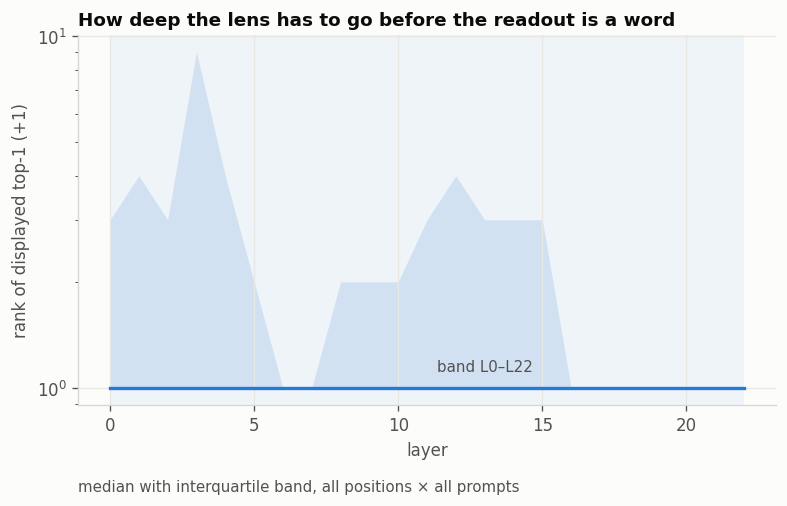

In [21]:
q = cells[~cells.is_model_row].groupby("layer")["rank"].quantile([0.25, 0.5, 0.75]).unstack()

fig, ax = plt.subplots(figsize=(7.5, 4))
band_shade(ax)
ax.fill_between(q.index, q[0.25] + 1, q[0.75] + 1, color=SERIES[0], alpha=0.15, lw=0)
ax.plot(q.index, q[0.5] + 1, color=SERIES[0], lw=2)
ax.set_yscale("log")
ax.set(xlabel="layer", ylabel="rank of displayed top-1 (+1)",
       title="How deep the lens has to go before the readout is a word")
ax.annotate(f"band L{band[0]}–L{band[-1]}", xy=(np.mean(band), q[0.5].min() + 1),
            xytext=(6, 10), textcoords="offset points", color=MUTED, fontsize=9)
fig.text(0.125, -0.07, "median with interquartile band, all positions × all prompts",
         color=MUTED, fontsize=9)
fig.savefig(OUT / "fig1_rank_vs_depth.png", bbox_inches="tight")

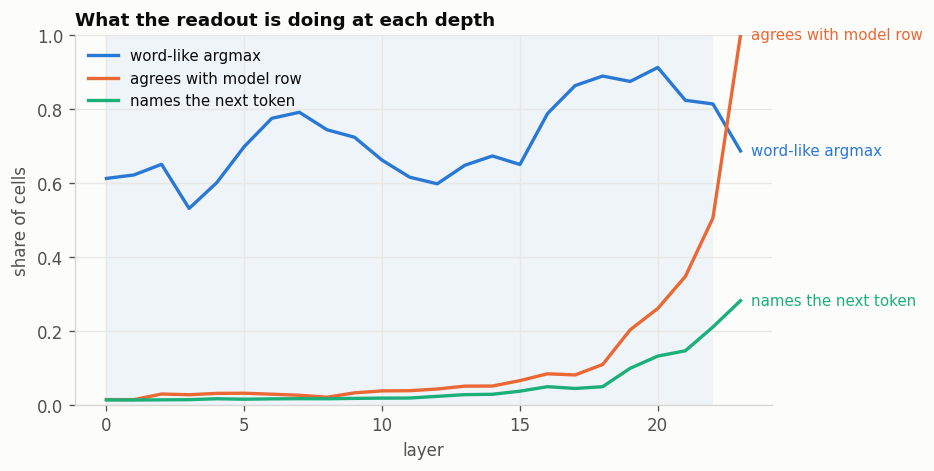

In [22]:
# the rightmost point is the model row itself, so its agreement is 1 by construction
fig, ax = plt.subplots(figsize=(7.5, 4))
band_shade(ax)
series = [("word-like argmax", "wordlike", SERIES[0]),
          ("agrees with model row", "agrees_model", SERIES[1]),
          ("names the next token", "hits_next_token", SERIES[2])]
for label, col, c in series:
    ax.plot(per_layer.layer, per_layer[col], color=c, lw=2, label=label)
    ax.annotate(label, xy=(per_layer.layer.iloc[-1], per_layer[col].iloc[-1]),
                xytext=(6, 0), textcoords="offset points", color=c, fontsize=9, va="center")
ax.set(xlabel="layer", ylabel="share of cells", ylim=(0, 1),
       title="What the readout is doing at each depth")
ax.legend(frameon=False, loc="upper left", fontsize=9)
fig.savefig(OUT / "fig2_rates_vs_depth.png", bbox_inches="tight")

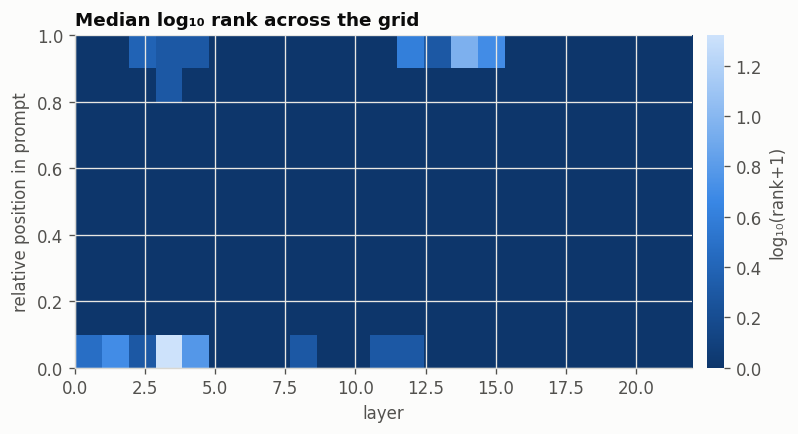

In [23]:
bins = np.linspace(0, 1, 11)
lens_cells = cells[~cells.is_model_row]
h = lens_cells.assign(bin=pd.cut(lens_cells.pos_frac, bins, include_lowest=True, labels=range(10)))
h = h.groupby(["bin", "layer"], observed=True)["rank"].apply(lambda s: np.log10(s + 1).median()).unstack()

fig, ax = plt.subplots(figsize=(8, 3.6))
im = ax.imshow(h.values, aspect="auto", origin="lower", cmap=BLUES.reversed(),
               extent=[h.columns.min(), h.columns.max(), 0, 1])
ax.set(xlabel="layer", ylabel="relative position in prompt",
       title="Median log₁₀ rank across the grid")
cb = fig.colorbar(im, ax=ax, pad=0.02); cb.set_label("log₁₀(rank+1)", color=MUTED)
cb.outline.set_visible(False)
fig.savefig(OUT / "fig3_position_layer_heatmap.png", bbox_inches="tight")

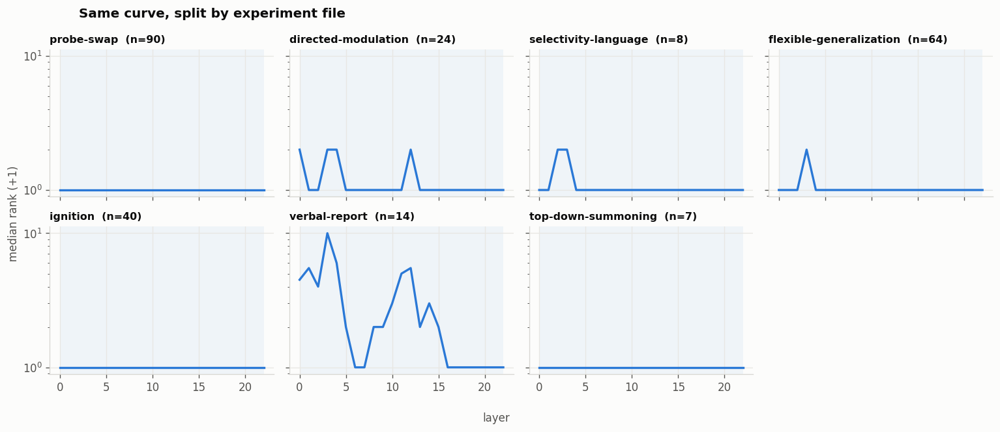

In [24]:
sources = cells.source.value_counts().index.tolist()[:8]
fig, axes = plt.subplots(2, 4, figsize=(13, 5.5), sharex=True, sharey=True)
for ax, src in zip(axes.ravel(), sources):
    sub = cells[(cells.source == src) & ~cells.is_model_row]
    m = sub.groupby("layer")["rank"].median()
    band_shade(ax)
    ax.plot(m.index, m + 1, color=SERIES[0], lw=2)
    ax.set_title(f"{src}  (n={sub.prompt.nunique()})", fontsize=9.5)
    ax.set_yscale("log")
for ax in axes.ravel()[len(sources):]:
    ax.set_visible(False)
fig.supxlabel("layer", color=MUTED, fontsize=10)
fig.supylabel("median rank (+1)", color=MUTED, fontsize=10)
fig.suptitle("Same curve, split by experiment file", x=0.09, ha="left", fontweight="bold")
fig.tight_layout()
fig.savefig(OUT / "fig4_by_source.png", bbox_inches="tight")

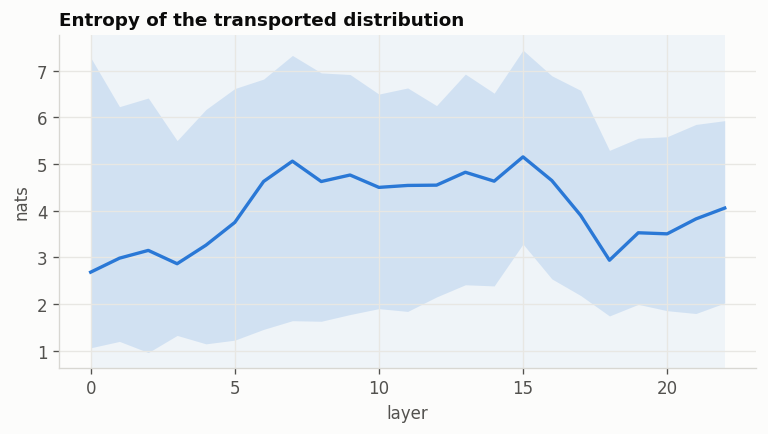

In [25]:
e = cells[~cells.is_model_row].groupby("layer")["entropy"].quantile([0.25, 0.5, 0.75]).unstack()

fig, ax = plt.subplots(figsize=(7.5, 3.6))
band_shade(ax)
ax.fill_between(e.index, e[0.25], e[0.75], color=SERIES[0], alpha=0.15, lw=0)
ax.plot(e.index, e[0.5], color=SERIES[0], lw=2)
ax.set(xlabel="layer", ylabel="nats",
       title="Entropy of the transported distribution")
fig.savefig(OUT / "fig5_entropy.png", bbox_inches="tight")

In [26]:
in_band = cells[cells.layer.between(band[0], band[-1])]
top = (in_band.groupby("top1").agg(cells=("rank", "size"), median_rank=("rank", "median"))
       .sort_values("cells", ascending=False).head(25))
top.assign(share=(top.cells / len(in_band)).round(4))

,cells,median_rank,share
top1,,,
assistant,2555,1.0,0.0269
Fact,1890,0.0,0.0199
name,899,0.0,0.0095
country,769,0.0,0.0081
being,724,0.0,0.0076
is,710,0.0,0.0075
s,689,0.0,0.0073
Crown,666,0.0,0.0070
a,636,0.0,0.0067


In [27]:
ascii_face = next(e for e in EXAMPLES if e.slug == "ascii-face")
face_prompt = resolve_prompt(ascii_face, tokenizer)
face_slice = compute_slice(model, lens, face_prompt, mask_display=True, max_seq_len=MAX_SEQ_LEN)
face_page, raw_b, payload_b = build_page(
    face_slice, face_prompt, title=ascii_face.section, description=ascii_face.description,
    alt_token=gloss, mode="fetch", out_dir=OUT / "slices" / ascii_face.slug,
)
(OUT / "slices" / ascii_face.slug / "index.html").write_text(face_page)
print(f"{raw_b/1e6:.1f} MB raw -> {payload_b/1e6:.2f} MB on the wire")

face_embed, _, _ = build_page(
    face_slice, face_prompt, title=ascii_face.section, description=ascii_face.description,
    alt_token=gloss,
)
notebook_iframe(face_embed)

0.0 MB raw -> 0.04 MB on the wire


In [28]:
import shutil
from google.colab import files

archive = shutil.make_archive("/content/jlens_week1", "zip", OUT)
print(archive, Path(archive).stat().st_size / 1e6, "MB")
files.download(archive)

/content/jlens_week1.zip 14.169124 MB


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>